# Menampilkan Visualisasi dan analisa data Covid-19

In [1]:
# 모듈 불러오기
import os
import numpy as np
import pandas as pd
import random
import seaborn as sns

import datetime as datetime
import matplotlib.dates as dates
import matplotlib.pyplot as plt

from contextlib import contextmanager
from time import time
from tqdm import tqdm


from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import KFold, train_test_split, GridSearchCV
from sklearn import metrics
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.pipeline import Pipeline

import datetime
from datetime import date

In [2]:
# 파일 불러오기
df = pd.read_csv("C:\\Users\\Hi\\JupyterProjects\\JupyterML\\data\\covid19_indo\\covid_19_indonesia_time_series_all.csv")

# 데이터 프레임 상단 20개 출력
df.head(20)

,Date,Location ISO Code,Location,New Cases,New Deaths,New Recovered,New Active Cases,Total Cases,Total Deaths,Total Recovered,...,Latitude,New Cases per Million,Total Cases per Million,New Deaths per Million,Total Deaths per Million,Total Deaths per 100rb,Case Fatality Rate,Case Recovered Rate,Growth Factor of New Cases,Growth Factor of New Deaths
0,3/1/2020,ID-JK,DKI Jakarta,2,0,0,2,39,20,41,...,-6.204699,0.18,3.60,0.00,1.84,0.18,51.28%,105.13%,NaN,NaN
1,3/2/2020,ID-JK,DKI Jakarta,2,0,0,2,41,20,41,...,-6.204699,0.18,3.78,0.00,1.84,0.18,48.78%,100.00%,1.0,1.0
2,3/2/2020,IDN,Indonesia,2,0,0,2,2,0,0,...,-0.789275,0.01,0.01,0.00,0.00,0.00,0.00%,0.00%,NaN,NaN
3,3/2/2020,ID-RI,Riau,1,0,0,1,2,0,3,...,0.511648,0.16,0.33,0.00,0.00,0.00,0.00%,150.00%,NaN,NaN
4,3/3/2020,ID-JK,DKI Jakarta,2,0,0,2,43,20,41,...,-6.204699,0.18,3.96,0.00,1.84,0.18,46.51%,95.35%,1.0,1.0
5,3/3/2020,IDN,Indonesia,0,0,0,0,2,0,0,...,-0.789275,0.00,0.01,0.00,0.00,0.00,0.00%,0.00%,0.0,1.0
6,3/3/2020,ID-JB,Jawa Barat,1,1,0,0,1,1,8,...,-6.920432,0.02,0.02,0.02,0.02,0.00,100.00%,800.00%,NaN,NaN
7,3/3/2020,ID-RI,Riau,0,0,0,0,2,0,3,...,0.511648,0.00,0.33,0.00,0.00,0.00,0.00%,150.00%,0.0,1.0
8,3/4/2020,ID-JK,DKI Jakarta,2,0,0,2,45,20,41,...,-6.204699,0.18,4.15,0.00,1.84,0.18,44.44%,91.11%,1.0,1.0
9,3/4/2020,IDN,Indonesia,0,0,0,0,2,0,0,...,-0.789275,0.00,0.01,0.00,0.00,0.00,0.00%,0.00%,1.0,1.0


In [3]:
# 날짜 데이터 형식 변경
date2=[]
for item in df['Date']:
    item2=item.split('/')
    month=int(item2[0])
    day=int(item2[1])
    year=int(item2[2])
    date2+=[datetime.date(year,month,day)] # /를 - 형태로, 년도부터 저장되도록 바꿈
df['Date'] = date2
df['Date'] = pd.to_datetime(df['Date'])

In [4]:
# 날짜 데이터 확인
print(df['Date'])

0       2020-03-01
1       2020-03-02
2       2020-03-02
3       2020-03-02
4       2020-03-03
           ...    
21754   2021-12-02
21755   2021-12-02
21756   2021-12-02
21757   2021-12-02
21758   2021-12-03
Name: Date, Length: 21759, dtype: datetime64[ns]


In [5]:
# 데이터 전처리 - 불필요한 열 제거 + 결측치 0으로
data = df.drop(['City or Regency','Location ISO Code',
                'Province','Country','Continent','Island','Time Zone','Special Status',
                'Total Regencies','Total Cities','Total Districts','Total Urban Villages',
                'Total Rural Villages','New Cases per Million','Total Cases per Million',
                'New Deaths per Million','Total Deaths per Million','Case Fatality Rate',
                'Case Recovered Rate','Growth Factor of New Cases','Growth Factor of New Deaths'],axis = 1)
data = data.fillna(0)

# 데이터 확인
data.head()

,Date,Location,New Cases,New Deaths,New Recovered,New Active Cases,Total Cases,Total Deaths,Total Recovered,Total Active Cases,Location Level,Area (km2),Population,Population Density,Longitude,Latitude,Total Deaths per 100rb
0,2020-03-01,DKI Jakarta,2,0,0,2,39,20,41,-22,Province,664,10846145,16334.31,106.836118,-6.204699,0.18
1,2020-03-02,DKI Jakarta,2,0,0,2,41,20,41,-20,Province,664,10846145,16334.31,106.836118,-6.204699,0.18
2,2020-03-02,Indonesia,2,0,0,2,2,0,0,2,Country,1916907,265185520,138.34,113.921327,-0.789275,0.00
3,2020-03-02,Riau,1,0,0,1,2,0,3,-1,Province,87024,6074100,69.80,101.805109,0.511648,0.00
4,2020-03-03,DKI Jakarta,2,0,0,2,43,20,41,-18,Province,664,10846145,16334.31,106.836118,-6.204699,0.18


In [6]:
data.tail()

,Date,Location,New Cases,New Deaths,New Recovered,New Active Cases,Total Cases,Total Deaths,Total Recovered,Total Active Cases,Location Level,Area (km2),Population,Population Density,Longitude,Latitude,Total Deaths per 100rb
21754,2021-12-02,Sulawesi Utara,2,0,0,2,34715,1056,33566,93,Province,13892,2641884,190.17,124.521240,1.259638,39.97
21755,2021-12-02,Sumatera Barat,4,0,0,4,89849,2152,87605,92,Province,42013,5519245,131.37,100.465062,-0.850253,38.99
21756,2021-12-02,Sumatera Selatan,4,0,0,4,59937,3071,56830,36,Province,91592,8217551,89.72,104.169465,-3.216212,37.37
21757,2021-12-02,Sumatera Utara,4,0,1,3,106045,2889,103061,95,Province,72981,14874889,203.82,99.051964,2.191894,19.42
21758,2021-12-03,Indonesia,245,8,328,-91,4257243,143858,4105680,7705,Country,1916907,265185520,138.34,113.921327,-0.789275,54.25


In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21759 entries, 0 to 21758
Data columns (total 17 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   Date                    21759 non-null  datetime64[ns]
 1   Location                21759 non-null  object        
 2   New Cases               21759 non-null  int64         
 3   New Deaths              21759 non-null  int64         
 4   New Recovered           21759 non-null  int64         
 5   New Active Cases        21759 non-null  int64         
 6   Total Cases             21759 non-null  int64         
 7   Total Deaths            21759 non-null  int64         
 8   Total Recovered         21759 non-null  int64         
 9   Total Active Cases      21759 non-null  int64         
 10  Location Level          21759 non-null  object        
 11  Area (km2)              21759 non-null  int64         
 12  Population              21759 non-null  int64 

In [9]:
# 데이터 전처리 - Location Level이 Country인 행 제거
data1 = data[data['Location Level'] != 'Country']
data1.head()

,Date,Location,New Cases,New Deaths,New Recovered,New Active Cases,Total Cases,Total Deaths,Total Recovered,Total Active Cases,Location Level,Area (km2),Population,Population Density,Longitude,Latitude,Total Deaths per 100rb
0,2020-03-01,DKI Jakarta,2,0,0,2,39,20,41,-22,Province,664,10846145,16334.31,106.836118,-6.204699,0.18
1,2020-03-02,DKI Jakarta,2,0,0,2,41,20,41,-20,Province,664,10846145,16334.31,106.836118,-6.204699,0.18
3,2020-03-02,Riau,1,0,0,1,2,0,3,-1,Province,87024,6074100,69.80,101.805109,0.511648,0.00
4,2020-03-03,DKI Jakarta,2,0,0,2,43,20,41,-18,Province,664,10846145,16334.31,106.836118,-6.204699,0.18
6,2020-03-03,Jawa Barat,1,1,0,0,1,1,8,-8,Province,35378,45161325,1276.55,107.603708,-6.920432,0.00


In [10]:
# 데이터 전처리 - Location 기준 중복행 제거. 단, 마지막 행 데이터는 남김
newest = data1.drop_duplicates(subset='Location', keep="last")
newest.head()

,Date,Location,New Cases,New Deaths,New Recovered,New Active Cases,Total Cases,Total Deaths,Total Recovered,Total Active Cases,Location Level,Area (km2),Population,Population Density,Longitude,Latitude,Total Deaths per 100rb
21364,2021-11-21,Gorontalo,1,0,0,1,11834,460,11374,0,Province,11257,1180651,104.88,122.376058,0.687003,38.96
21617,2021-11-28,Maluku Utara,2,0,3,-1,12101,303,11757,41,Province,31983,1307803,40.89,127.539107,0.212037,23.17
21700,2021-12-01,Bengkulu,1,0,0,1,23104,473,22612,19,Province,19919,1999539,100.38,102.338421,-3.533584,23.66
21712,2021-12-01,Kalimantan Utara,1,0,0,1,35885,811,35039,35,Province,75468,648407,8.59,116.218879,2.891013,125.08
21714,2021-12-01,Kepulauan Riau,2,0,0,2,53884,1748,52120,16,Province,8202,1929400,235.24,108.261746,3.916346,90.60


In [11]:
# 데이터 전처리 - Location이 Indonesia가 아닌 데이터 중에서, Total Cases 기준으로 내림차순 정렬
newest[newest.Location != 'Indonesia'].sort_values(by=['Total Cases'], ascending=False)

,Date,Location,New Cases,New Deaths,New Recovered,New Active Cases,Total Cases,Total Deaths,Total Recovered,Total Active Cases,Location Level,Area (km2),Population,Population Density,Longitude,Latitude,Total Deaths per 100rb
21733,2021-12-02,DKI Jakarta,28,0,0,28,864045,13596,849875,574,Province,664,10846145,16334.31,106.836118,-6.204699,125.35
21737,2021-12-02,Jawa Barat,83,0,6,77,707934,14737,692101,1096,Province,35378,45161325,1276.55,107.603708,-6.920432,32.63
21738,2021-12-02,Jawa Tengah,30,1,6,23,486435,30225,454837,1373,Province,32801,36364072,1108.64,110.201115,-7.259097,83.12
21739,2021-12-02,Jawa Timur,35,0,11,24,399478,29697,369537,244,Province,47803,40479023,846.78,112.732941,-7.723346,73.36
21743,2021-12-02,Kalimantan Timur,7,0,2,5,158245,5449,152714,82,Province,129067,3552191,27.52,116.468440,0.453858,153.40
21734,2021-12-02,Daerah Istimewa Yogyakarta,7,0,0,7,156769,5263,150965,541,Province,3133,3631015,1158.90,110.444878,-7.894502,144.95
21732,2021-12-02,Banten,16,0,1,15,132693,2688,129872,133,Province,9663,10722374,1109.64,106.109004,-6.456736,25.07
21750,2021-12-02,Riau,4,0,0,4,128825,4109,124123,593,Province,87024,6074100,69.80,101.805109,0.511648,67.65
21731,2021-12-02,Bali,15,1,1,13,114233,4046,110003,184,Province,5780,4216171,729.43,115.131714,-8.369472,95.96
21751,2021-12-02,Sulawesi Selatan,1,1,1,-1,109919,2238,107630,51,Province,46717,9426885,201.78,120.162056,-3.731081,23.74


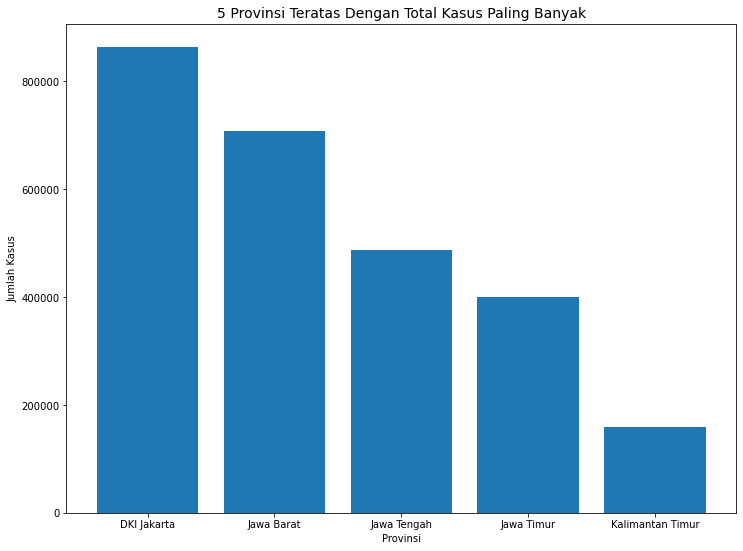

In [13]:
# Total Cases 기준 내림차순 정렬 + 마지막 5개 데이터 그리기
plt.figure(figsize=(12,9))
plt.bar(newest[newest.Location != 'Indonesia'].sort_values(by=['Total Cases'], ascending=False)['Location'].values[:5], newest[newest.Location != 'Indonesia'].sort_values(by=['Total Cases'], ascending=False)['Total Cases'].values[:5])
plt.title('확진자가 가장 많은 상위 5개 주', fontsize=14)
plt.xlabel('Provinsi')
plt.ylabel('확진자 수')
plt.show()

C:\Users\Hi\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


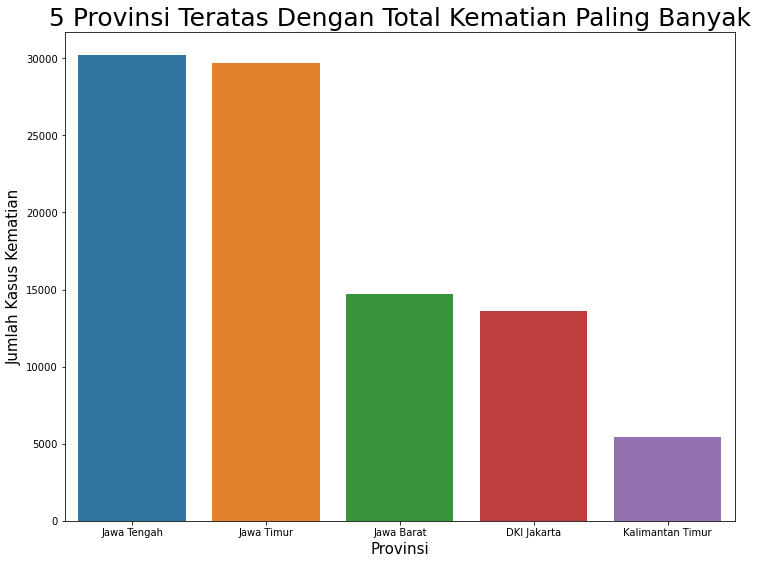

In [14]:
# Total Deaths 기준 내림차순 정렬 + 마지막 5개 데이터 그리기
plt.figure(figsize=(12,9))
sns.barplot(newest[newest.Location != 'Indonesia'].sort_values(by=['Total Deaths'], ascending=False)['Location'].values[:5],  newest[newest.Location != 'Indonesia'].sort_values(by=['Total Deaths'], ascending=False)['Total Deaths'].values[:5])
plt.title('사망자가 가장 많은 상위 5개 주', fontsize=25)
plt.xlabel('Province', fontsize=15)
plt.ylabel('사망자 수', fontsize=15)
plt.show()

C:\Users\Hi\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


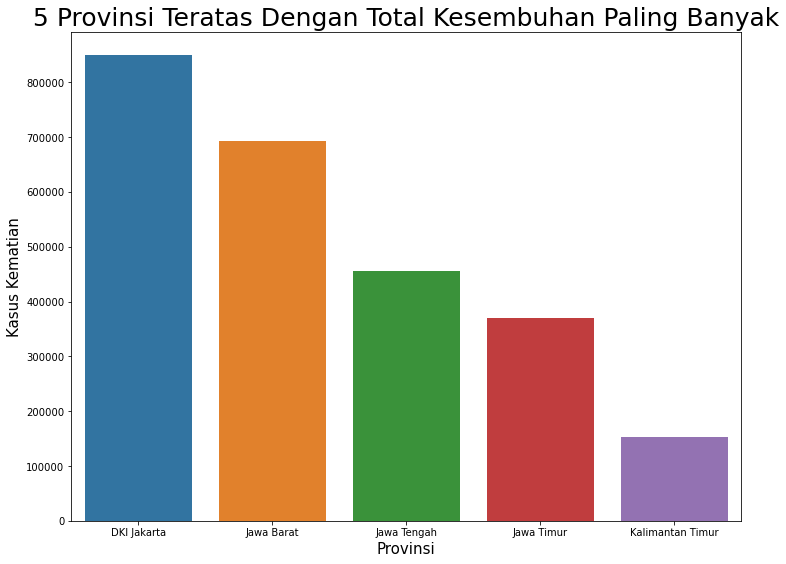

In [15]:
# Total Recovered 기준 내림차순 정렬 + 마지막 5개 데이터 그리기
plt.figure(figsize=(12,9))
sns.barplot(newest[newest.Location != 'Indonesia'].sort_values(by=['Total Recovered'], ascending=False)['Location'].values[:5],  newest[newest.Location != 'Indonesia'].sort_values(by=['Total Recovered'], ascending=False)['Total Recovered'].values[:5])
plt.title('완치자가 가장 많은 상위 5개 주', fontsize=25)
plt.xlabel('Provinsi', fontsize=15)
plt.ylabel('완치자 수', fontsize=15)
plt.show()

C:\Users\Hi\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


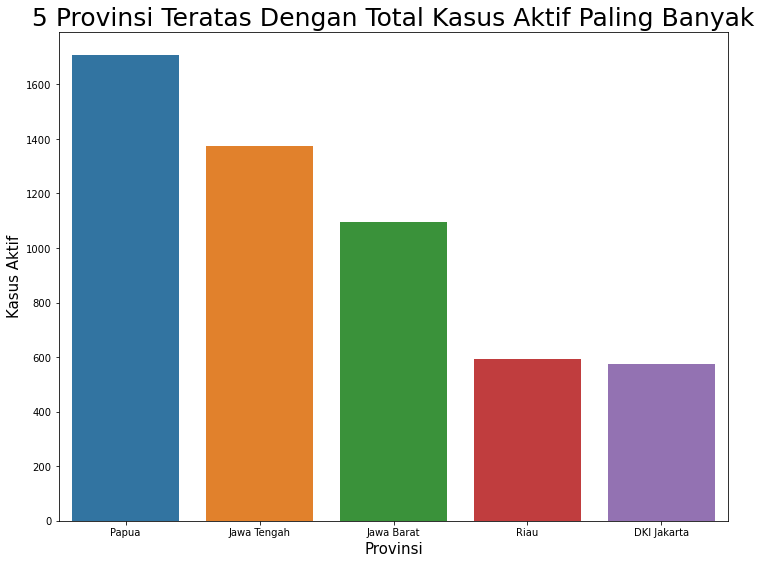

In [16]:
# Total Active Cases 기준 내림차순 정렬 + 마지막 5개 데이터 그리기
plt.figure(figsize=(12,9))
sns.barplot(newest[newest.Location != 'Indonesia'].sort_values(by=['Total Active Cases'], ascending=False)['Location'].values[:5],  newest[newest.Location != 'Indonesia'].sort_values(by=['Total Active Cases'], ascending=False)['Total Active Cases'].values[:5])
plt.title('총 활성 사례가 가장 많은 상위 5개 주', fontsize=25)
plt.xlabel('Provinsi', fontsize=15)
plt.ylabel('총 활성 사례수', fontsize=15)
plt.show()

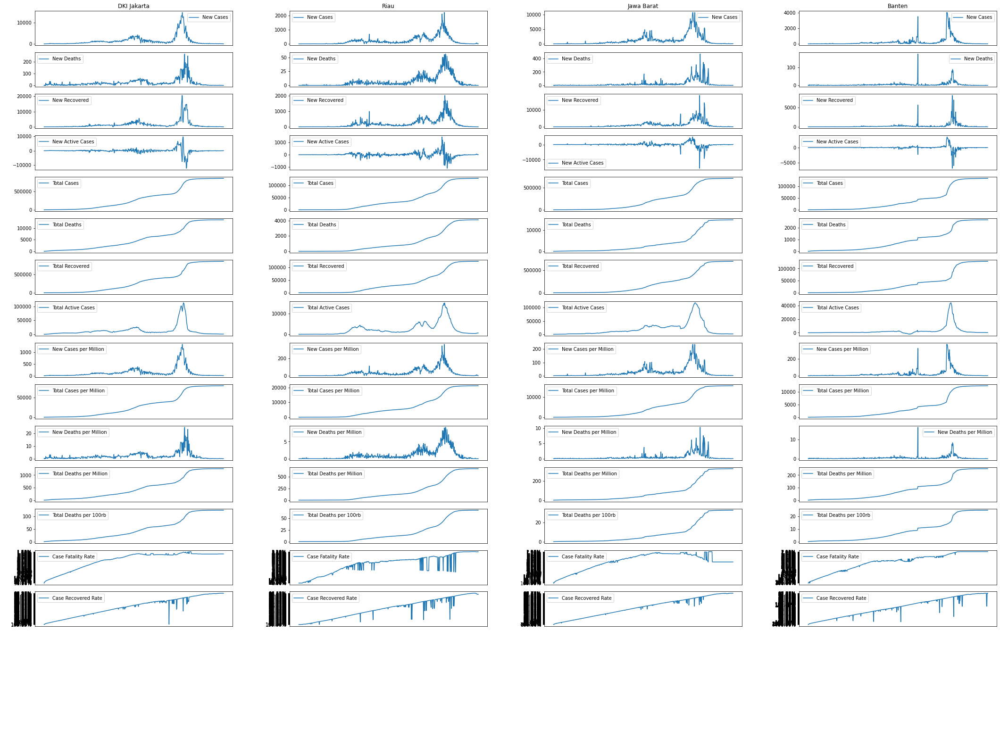

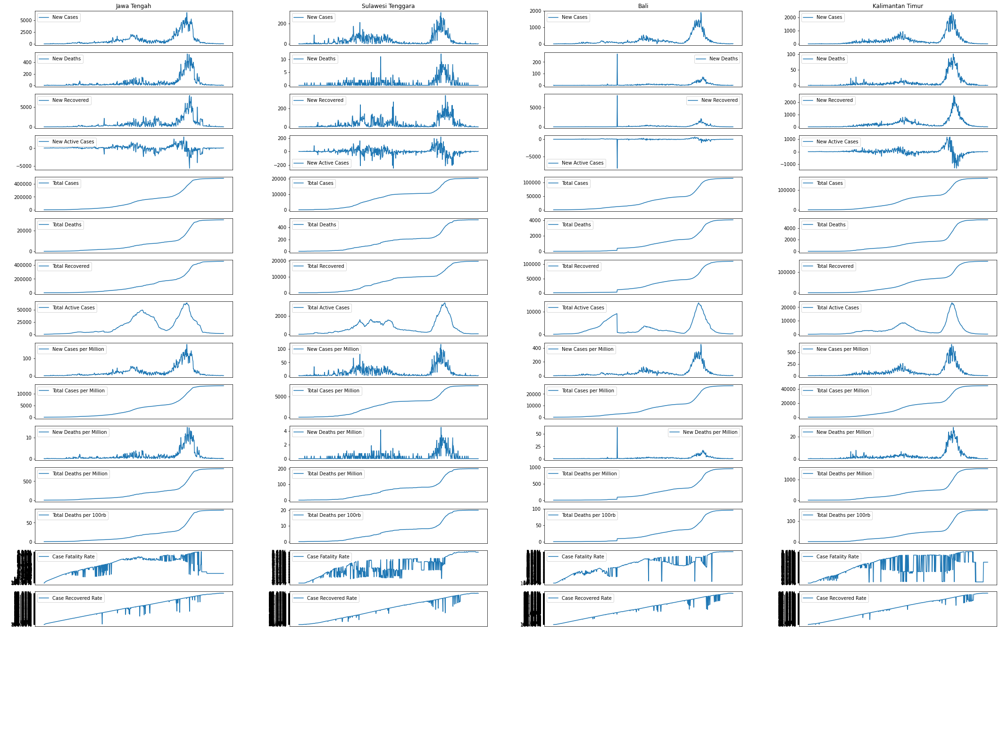

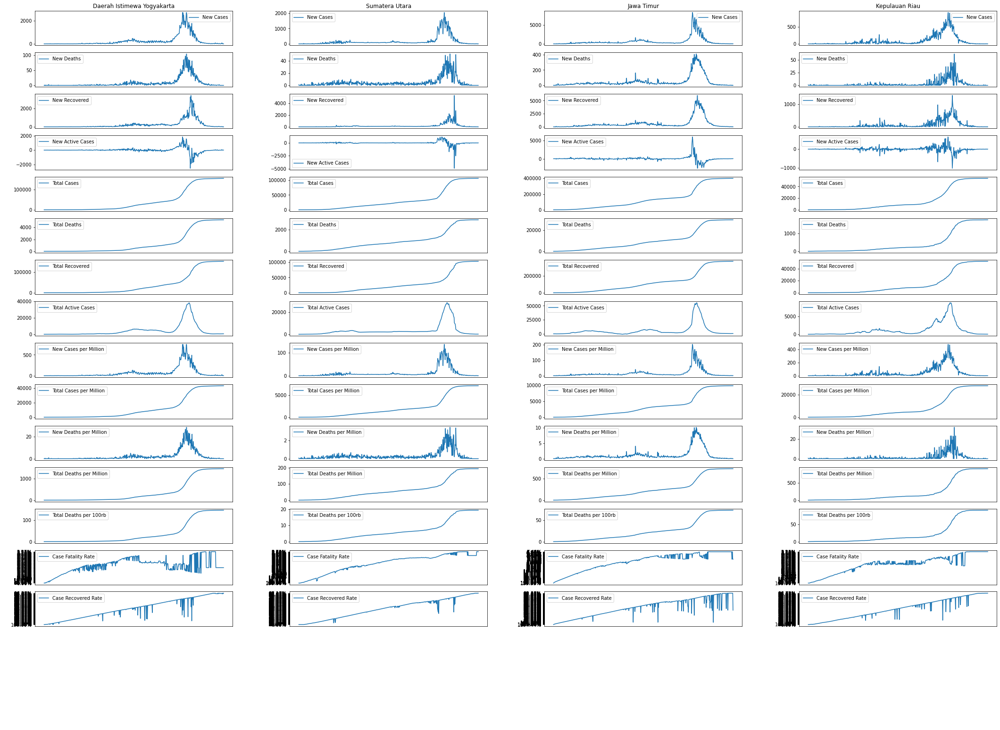

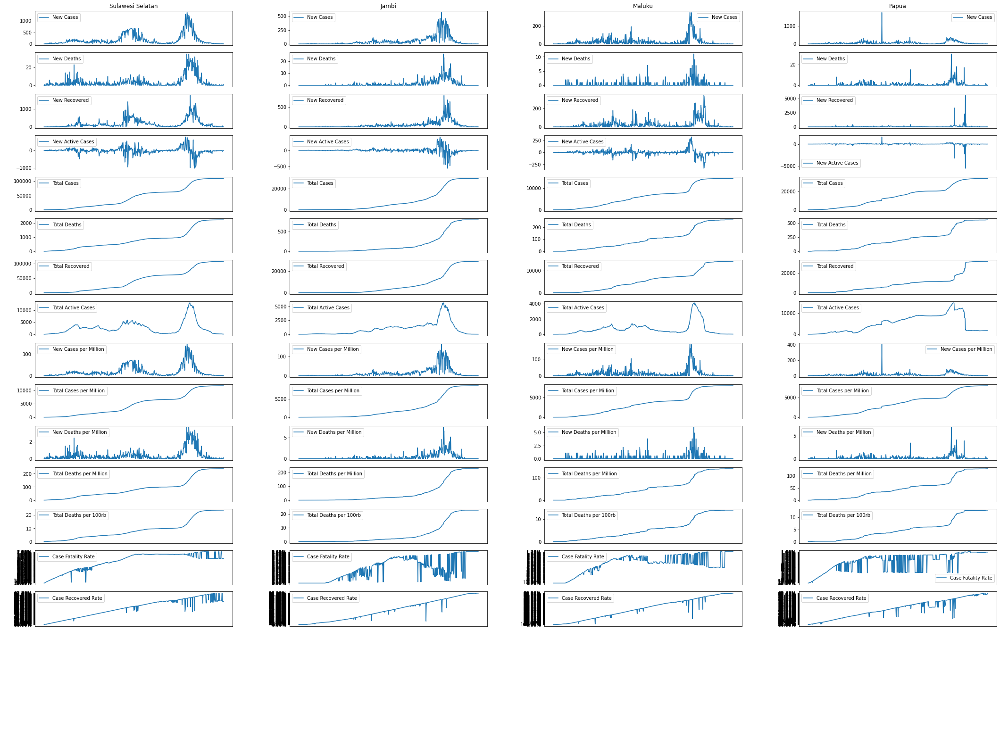

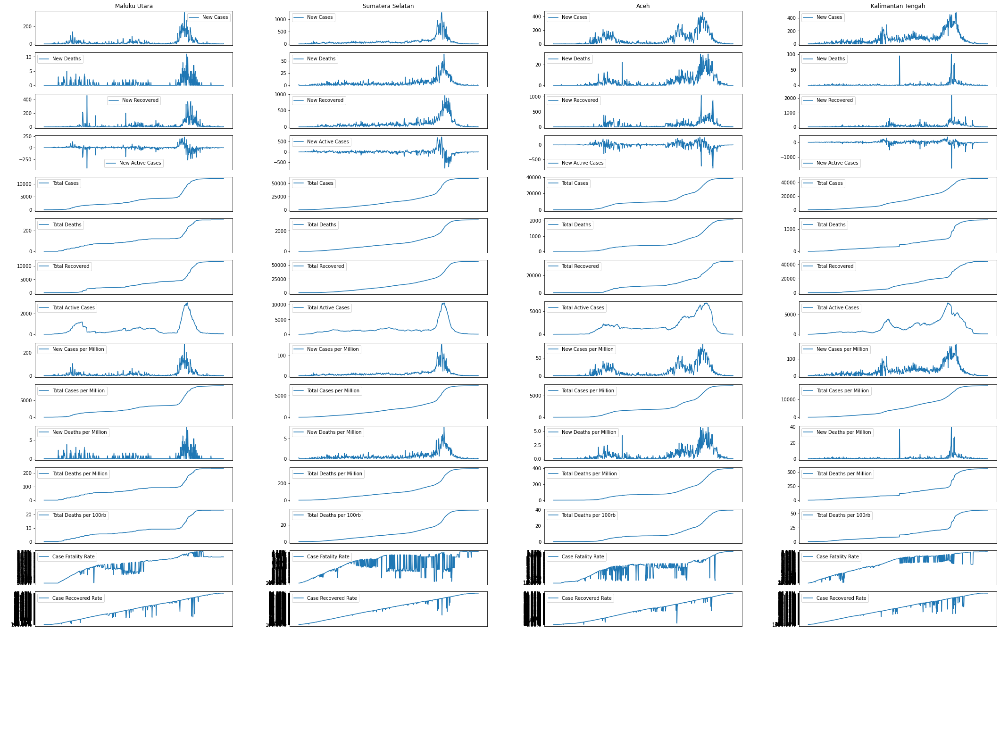

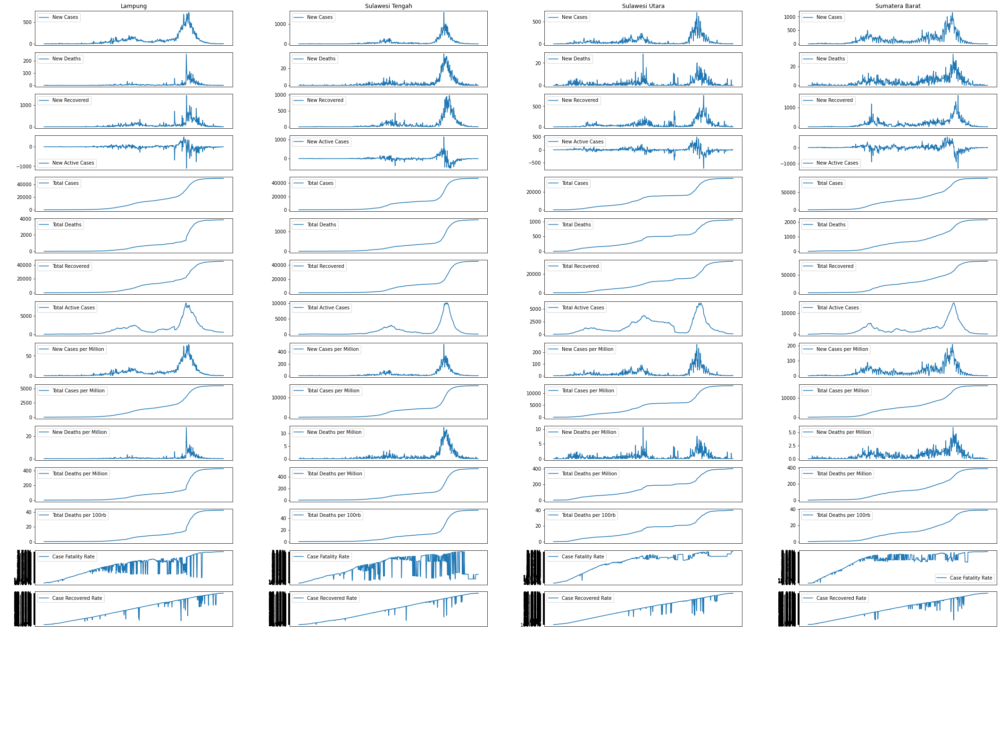

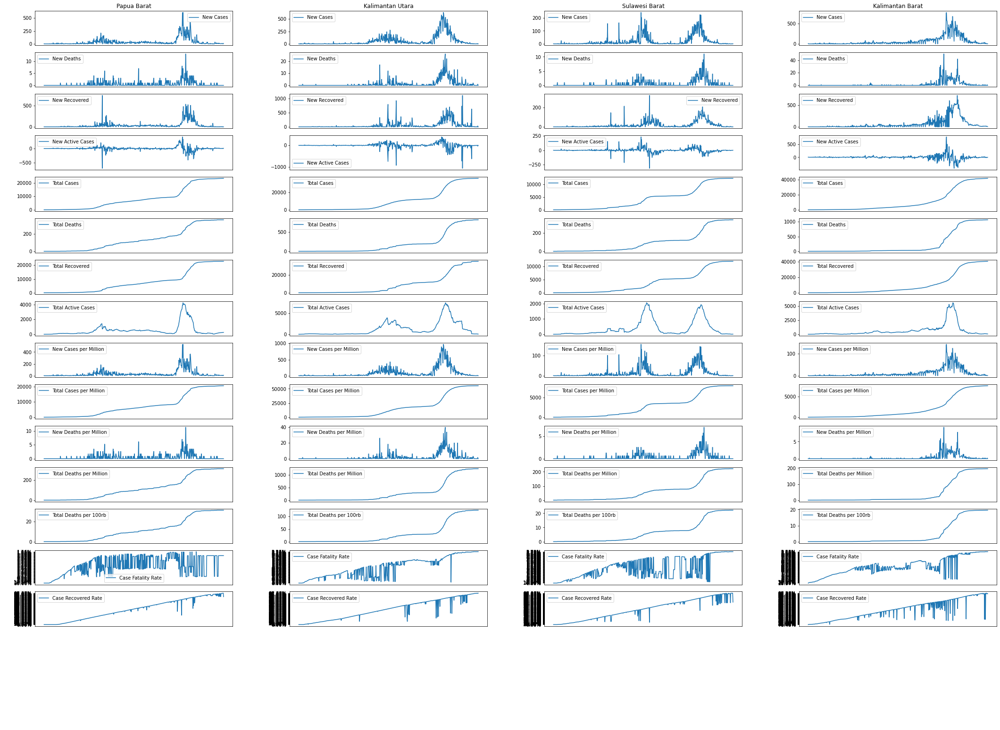

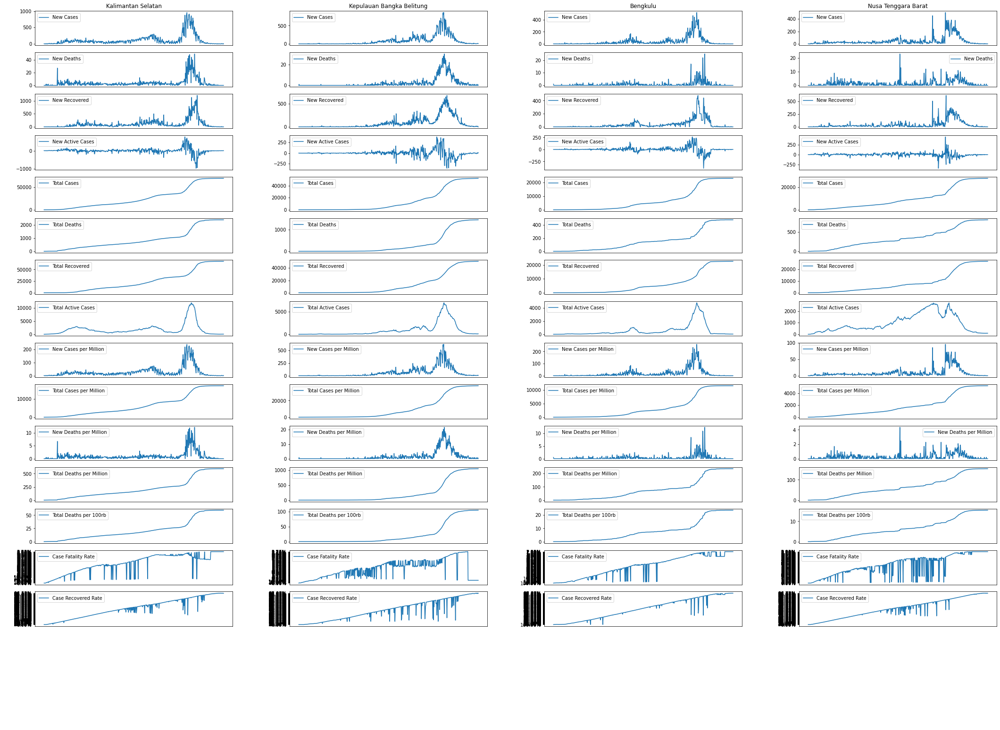

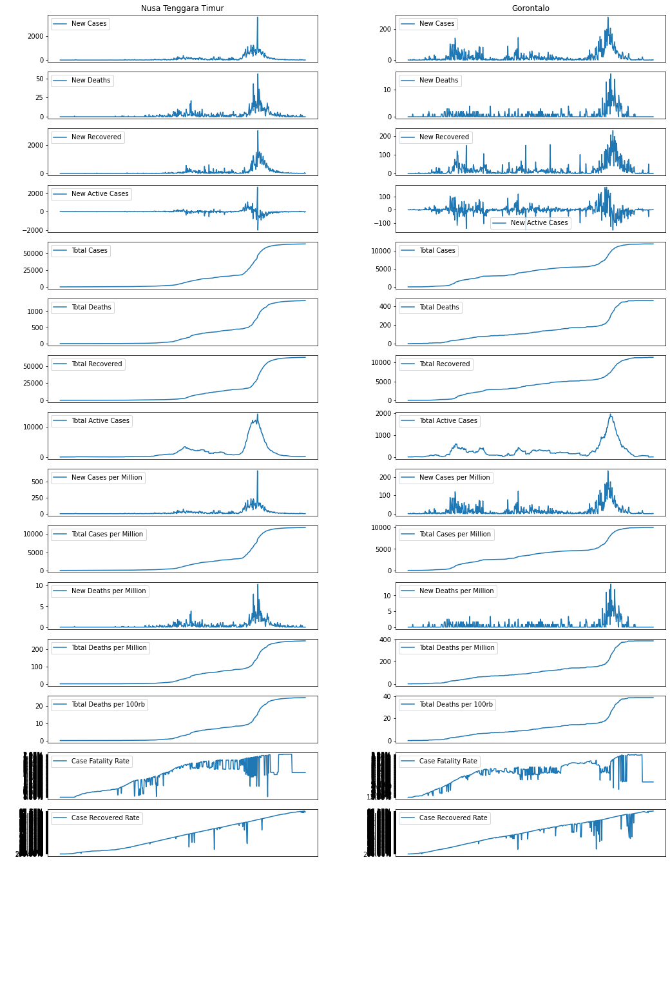

In [17]:
import matplotlib as mpl
import matplotlib.pyplot as plt
columnsToPlot = ['New Cases',	'New Deaths',	'New Recovered',	'New Active Cases',	'Total Cases',	'Total Deaths',	'Total Recovered',	'Total Active Cases',	'New Cases per Million',	'Total Cases per Million',	'New Deaths per Million',	'Total Deaths per Million',	'Total Deaths per 100rb',	'Case Fatality Rate',	'Case Recovered Rate']

plotScale = 6
mpl.rcParams['figure.figsize'] = (5*plotScale, 4*plotScale)

listOfLocations = data1['Location'].unique()
numOfCol = 4

#nda sangka kalo ba plotting di matplotlib itu pica-pica ontak :')

#kase bagi tiap baris 4 kolom
for locGroup in range(0, len(listOfLocations), numOfCol):
  #bekeng figure baru tiap baris
  fig = plt.figure(constrained_layout=False)

  #subfigure yang ba panjang ke kanan
  subplots = fig.subfigures(1,4)

  #listOfLocations[locGroup:locGroup + numOfCol]
  #
  #maksudnya slice tu array listOfLocations, mulai dari index locGroup, sampe index locGroup + numOfCol
  #jadi nanti depe elemen maximum ada 4
  for idxLoc, location in enumerate(listOfLocations[locGroup:locGroup + numOfCol]):
    #filter data cuma for itu lokasi
    df1 = df[df['Location'] == location]
    df1.sort_values('Date')
    #bekeng subplot yang ba panjang ke bawah for mo se tunjung dpe graf
    ax = subplots[idxLoc].subplots(len(columnsToPlot), 1)

    #mulai enumerasi tiap nilai dari dataset, kong se muncul di graf satu satu
    #
    #variabel 'ax' itu berupa list yang ada subaxes for torang mo plot akang graf
    for idxCol, (axes, columns) in enumerate(zip(ax, columnsToPlot)):
      #ba cit, bekeng supaya graf pertama se muncul title
      if idxCol == 0:
        axes.set_title(location)

      #plot graf di 'axes' itu
      axes.plot(df1[columns], label=columns)
      axes.get_xaxis().set_ticks([])
      axes.legend()

In [20]:
# !pip install plotly # 시각화 모듈 설치

In [22]:
import plotly.graph_objects as go
fig = go.Figure()
fig.add_trace(go.Scatter(x=data1['Date'],
                         y=data1['Total Cases'],
                         mode='lines',
                         name= 'Total Cases'
                        ))

fig.update_layout(title='Jumlah Kasus sampai pada Desember 2021',
                 template='plotly_white',
                 xaxis_title='Date',
                 yaxis_title='Total Cases'
                 )
fig.show()


In [23]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=data1['Date'],
                         y=data1['New Cases'],
                         mode='lines',
                         name= 'Total Cases'
                        ))

fig.update_layout(title='Jumlah Kasus Baru sampai pada Desember 2021',
                 template='plotly_white',
                 xaxis_title='Date',
                 yaxis_title='Total Cases'
                 )
fig.show()


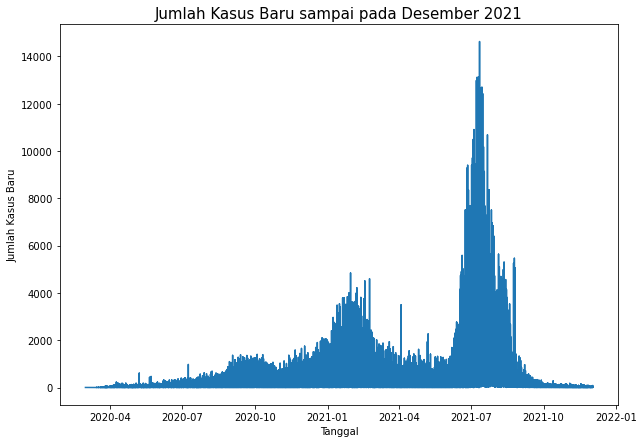

In [24]:
#Zooming trend kasus kematian Covid di DKI Jakarta di 7 hari terakhir (sampai 9 Juli 2021)
plt.figure(figsize=(10,7))
plt.plot(data1['Date'].values ,data1['New Cases'].values)
plt.title('Jumlah Kasus Baru sampai pada Desember 2021', fontsize=15)
plt.xlabel('Tanggal')
plt.ylabel('Jumlah Kasus Baru')
plt.show()

In [25]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=data1['Date'],
                         y=data1['Total Active Cases'],
                         mode='lines',
                         name= 'Active Cases',
                         marker_color= 'red'
                         ))

fig.update_layout(title='Jumlah Kasus Aktif sampai pada Desember 2021',
                 template='plotly_white',
                 xaxis_title='Date',
                 yaxis_title='Total Cases'
                 )
fig.show()

In [26]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=data1['Date'],
                         y=data1['New Deaths'],
                         mode='lines',
                         name='Death Cases',
                         marker_color='black'
                         #line=dict(dash='dot')
                        ))

fig.update_layout(title='Jumlah Kematian Baru sampai pada Desember 2021',
                 template='plotly_white',
                 xaxis_title='Date',
                 yaxis_title='Total Cases'
                 )
fig.show()

In [27]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=data1['Date'],
                         y=data1['New Recovered'],
                         mode='lines',
                         name='Recovered Case',
                         marker_color='green'
                        ))

fig.update_layout(title='Jumlah Recovered Baru sampai pada Desember 2021',
                 template='plotly_white',
                 xaxis_title='Date',
                 yaxis_title='Total Cases'
                 )
fig.show()


In [28]:
newest['Date']

21364   2021-11-21
21617   2021-11-28
21700   2021-12-01
21712   2021-12-01
21714   2021-12-01
21716   2021-12-01
21722   2021-12-01
21730   2021-12-02
21731   2021-12-02
21732   2021-12-02
21733   2021-12-02
21734   2021-12-02
21736   2021-12-02
21737   2021-12-02
21738   2021-12-02
21739   2021-12-02
21740   2021-12-02
21741   2021-12-02
21742   2021-12-02
21743   2021-12-02
21744   2021-12-02
21745   2021-12-02
21746   2021-12-02
21747   2021-12-02
21748   2021-12-02
21749   2021-12-02
21750   2021-12-02
21751   2021-12-02
21752   2021-12-02
21753   2021-12-02
21754   2021-12-02
21755   2021-12-02
21756   2021-12-02
21757   2021-12-02
Name: Date, dtype: datetime64[ns]

In [29]:
# Highlight khusus COVID 19 DKI Jakarta
jakarta = data[data.Location == 'DKI Jakarta']
jakarta

,Date,Location,New Cases,New Deaths,New Recovered,New Active Cases,Total Cases,Total Deaths,Total Recovered,Total Active Cases,Location Level,Area (km2),Population,Population Density,Longitude,Latitude,Total Deaths per 100rb
0,2020-03-01,DKI Jakarta,2,0,0,2,39,20,41,-22,Province,664,10846145,16334.31,106.836118,-6.204699,0.18
1,2020-03-02,DKI Jakarta,2,0,0,2,41,20,41,-20,Province,664,10846145,16334.31,106.836118,-6.204699,0.18
4,2020-03-03,DKI Jakarta,2,0,0,2,43,20,41,-18,Province,664,10846145,16334.31,106.836118,-6.204699,0.18
8,2020-03-04,DKI Jakarta,2,0,0,2,45,20,41,-16,Province,664,10846145,16334.31,106.836118,-6.204699,0.18
12,2020-03-05,DKI Jakarta,0,1,0,-1,45,21,41,-17,Province,664,10846145,16334.31,106.836118,-6.204699,0.19
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21601,2021-11-28,DKI Jakarta,51,0,52,-1,863862,13596,849803,463,Province,664,10846145,16334.31,106.836118,-6.204699,125.35
21635,2021-11-29,DKI Jakarta,41,0,71,-30,863903,13596,849874,433,Province,664,10846145,16334.31,106.836118,-6.204699,125.35
21668,2021-11-30,DKI Jakarta,44,0,0,44,863947,13596,849874,477,Province,664,10846145,16334.31,106.836118,-6.204699,125.35
21701,2021-12-01,DKI Jakarta,70,0,1,69,864017,13596,849875,546,Province,664,10846145,16334.31,106.836118,-6.204699,125.35


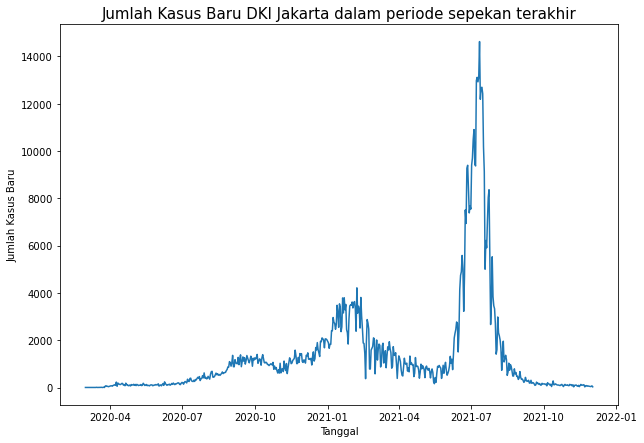

In [30]:
#Zooming trend kasus kematian Covid di DKI Jakarta sampai DES 2021
plt.figure(figsize=(10,7))
plt.plot(jakarta['Date'].values ,jakarta['New Cases'].values)
plt.title('Jumlah Kasus Baru DKI Jakarta dalam periode sepekan terakhir', fontsize=15)
plt.xlabel('Tanggal')
plt.ylabel('Jumlah Kasus Baru')
plt.show()

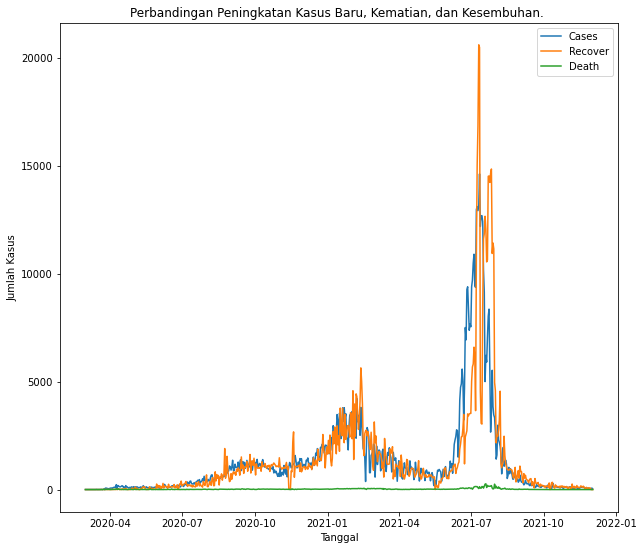

In [31]:
# Perbandingan Peningkatan Kasus Baru, Kematian, dan Kesembuhan
plt.figure(figsize=(10,9))
plt.plot(jakarta['Date'].values ,jakarta['New Cases'].values, label='Cases')
plt.plot(jakarta['Date'].values, jakarta['New Recovered'].values, label = 'Recover')
plt.plot(jakarta['Date'].values, jakarta['New Deaths'].values, label = 'Death')
plt.title('Perbandingan Peningkatan Kasus Baru, Kematian, dan Kesembuhan. ')
plt.xlabel('Tanggal')
plt.ylabel('Jumlah Kasus')
plt.legend()
plt.show()

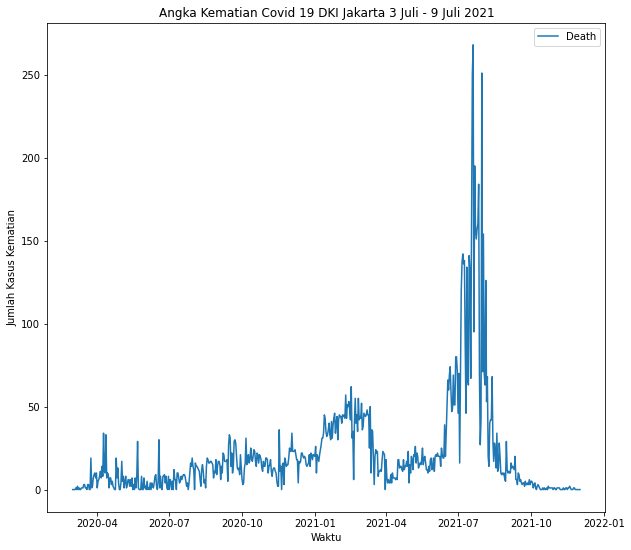

In [32]:
# Angka Kematian Covid 19 DKI Jakarta sampai Des 2021
plt.figure(figsize=(10,9))
plt.plot(jakarta['Date'].values, jakarta['New Deaths'].values, label = 'Death')
plt.title('Angka Kematian Covid 19 DKI Jakarta 3 Juli - 9 Juli 2021')
plt.xlabel('Waktu')
plt.ylabel('Jumlah Kasus Kematian')
plt.legend()
plt.show()

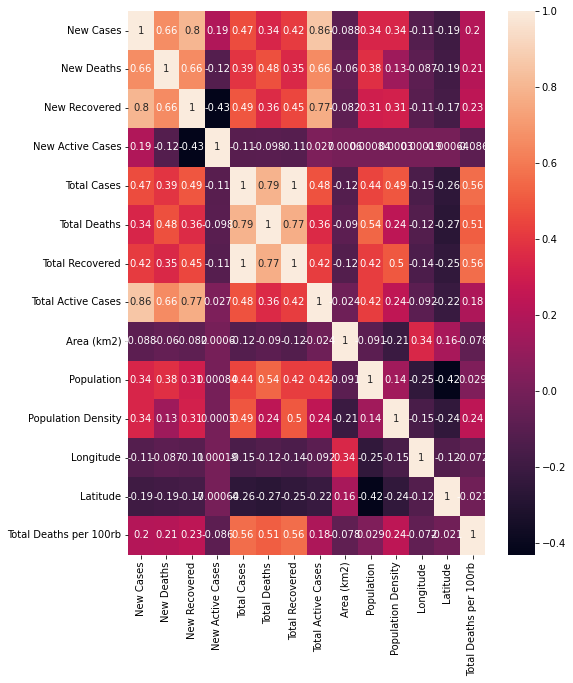

In [33]:
#Melihat korelasi antar variabel dalam suatu heatmap
plt.figure(figsize=(8,10))
sns.heatmap(data1.corr(), annot=True)
plt.show()

In [21]:
data1.head()

,Date,Location,New Cases,New Deaths,New Recovered,New Active Cases,Total Cases,Total Deaths,Total Recovered,Total Active Cases,Location Level,Area (km2),Population,Population Density,Longitude,Latitude,Total Deaths per 100rb
0,2020-03-01,DKI Jakarta,2,0,0,2,39,20,41,-22,Province,664,10846145,16334.31,106.836118,-6.204699,0.18
1,2020-03-02,DKI Jakarta,2,0,0,2,41,20,41,-20,Province,664,10846145,16334.31,106.836118,-6.204699,0.18
3,2020-03-02,Riau,1,0,0,1,2,0,3,-1,Province,87024,6074100,69.80,101.805109,0.511648,0.00
4,2020-03-03,DKI Jakarta,2,0,0,2,43,20,41,-18,Province,664,10846145,16334.31,106.836118,-6.204699,0.18
6,2020-03-03,Jawa Barat,1,1,0,0,1,1,8,-8,Province,35378,45161325,1276.55,107.603708,-6.920432,0.00


In [34]:
# 데이터 전처리 - 필요한 열만 남김
data2 = data1[['New Deaths', 'New Cases','Total Cases', 'New Recovered', 'Total Recovered', 'Total Deaths','Population', 'Population Density']]
data2.head()

,New Deaths,New Cases,Total Cases,New Recovered,Total Recovered,Total Deaths,Population,Population Density
0,0,2,39,0,41,20,10846145,16334.31
1,0,2,41,0,41,20,10846145,16334.31
3,0,1,2,0,3,0,6074100,69.80
4,0,2,43,0,41,20,10846145,16334.31
6,1,1,1,0,8,1,45161325,1276.55


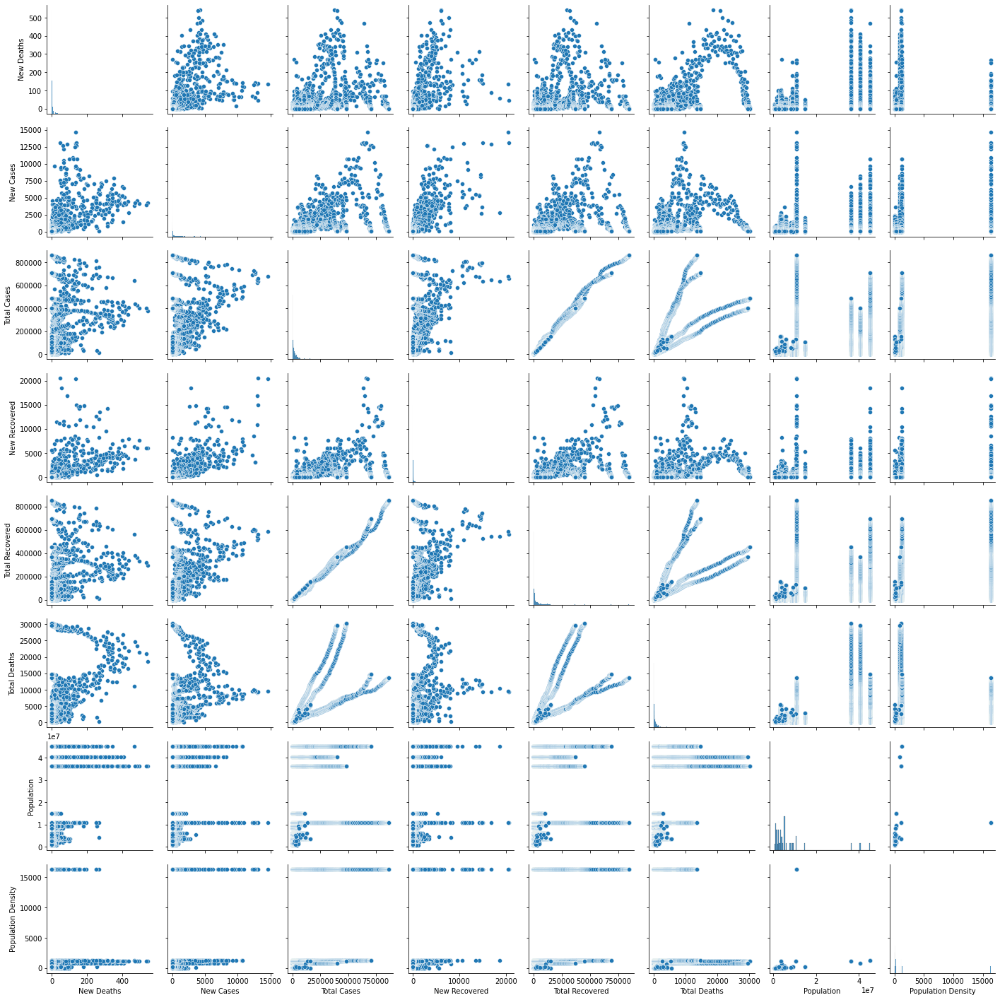

In [35]:
#Melihat korelasi antar variabel dari sebaran data pada scatter plot 
sns.pairplot(data2)
plt.show()

In [39]:
# Highlight khusus COVID 19 DKI Jakarta
sulut = data[data.Location == 'Sulawesi Utara']
sulut

,Date,Location,New Cases,New Deaths,New Recovered,New Active Cases,Total Cases,Total Deaths,Total Recovered,Total Active Cases,Location Level,Area (km2),Population,Population Density,Longitude,Latitude,Total Deaths per 100rb
259,2020-03-26,Sulawesi Utara,1,0,1,0,1,0,1,0,Province,13892,2641884,190.17,124.52124,1.259638,0.00
285,2020-03-27,Sulawesi Utara,0,0,0,0,1,0,1,0,Province,13892,2641884,190.17,124.52124,1.259638,0.00
313,2020-03-28,Sulawesi Utara,0,0,0,0,1,0,1,0,Province,13892,2641884,190.17,124.52124,1.259638,0.00
342,2020-03-29,Sulawesi Utara,0,0,0,0,1,0,1,0,Province,13892,2641884,190.17,124.52124,1.259638,0.00
373,2020-03-30,Sulawesi Utara,0,0,0,0,1,0,1,0,Province,13892,2641884,190.17,124.52124,1.259638,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21627,2021-11-28,Sulawesi Utara,2,0,0,2,34699,1056,33556,87,Province,13892,2641884,190.17,124.52124,1.259638,39.97
21660,2021-11-29,Sulawesi Utara,7,0,1,6,34706,1056,33557,93,Province,13892,2641884,190.17,124.52124,1.259638,39.97
21693,2021-11-30,Sulawesi Utara,7,0,1,6,34713,1056,33558,99,Province,13892,2641884,190.17,124.52124,1.259638,39.97
21726,2021-12-01,Sulawesi Utara,0,0,8,-8,34713,1056,33566,91,Province,13892,2641884,190.17,124.52124,1.259638,39.97


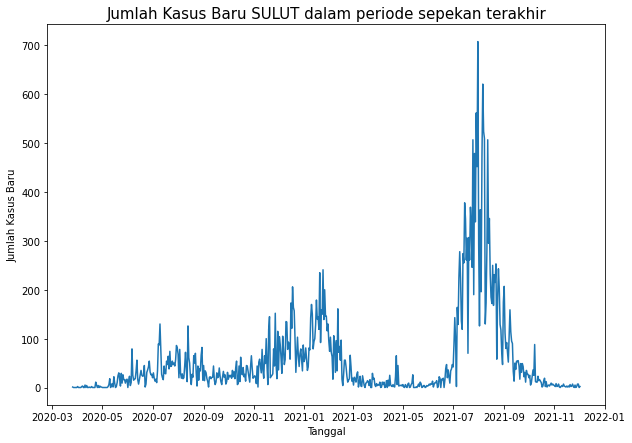

In [40]:
#Zooming trend kasus kematian Covid di DKI Jakarta sampai DES 2021
plt.figure(figsize=(10,7))
plt.plot(sulut['Date'].values ,sulut['New Cases'].values)
plt.title('Jumlah Kasus Baru SULUT dalam periode sepekan terakhir', fontsize=15)
plt.xlabel('Tanggal')
plt.ylabel('Jumlah Kasus Baru')
plt.show()

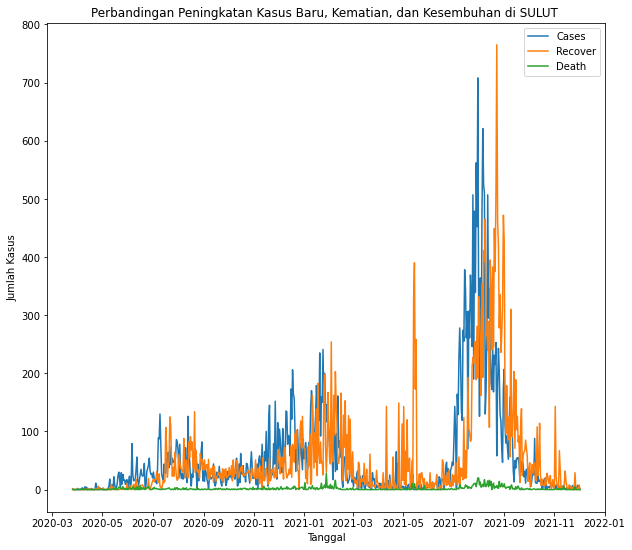

In [41]:
# Perbandingan Peningkatan Kasus Baru, Kematian, dan Kesembuhan
plt.figure(figsize=(10,9))
plt.plot(sulut['Date'].values ,sulut['New Cases'].values, label='Cases')
plt.plot(sulut['Date'].values, sulut['New Recovered'].values, label = 'Recover')
plt.plot(sulut['Date'].values, sulut['New Deaths'].values, label = 'Death')
plt.title('Perbandingan Peningkatan Kasus Baru, Kematian, dan Kesembuhan di SULUT ')
plt.xlabel('Tanggal')
plt.ylabel('Jumlah Kasus')
plt.legend()
plt.show()

# Visualisasi Mapping Covid 19 di wilayah NKRI

In [56]:
!pip install geopandas

  Using cached geopandas-0.10.2-py2.py3-none-any.whl (1.0 MB)
  Using cached Fiona-1.8.21.tar.gz (1.0 MB)
  Using cached Fiona-1.8.20.tar.gz (1.3 MB)
  Using cached Fiona-1.8.19.tar.gz (1.3 MB)
  Using cached Fiona-1.8.18.tar.gz (1.3 MB)
  Using cached Fiona-1.8.17.tar.gz (1.3 MB)
  Using cached Fiona-1.8.16.tar.gz (1.3 MB)
  Using cached Fiona-1.8.15.tar.gz (1.3 MB)
  Using cached Fiona-1.8.14.tar.gz (1.3 MB)
  Using cached Fiona-1.8.13.post1.tar.gz (1.2 MB)
  Using cached Fiona-1.8.13.tar.gz (1.2 MB)
  Using cached Fiona-1.8.12.tar.gz (1.2 MB)
  Using cached Fiona-1.8.11.tar.gz (1.2 MB)
  Using cached Fiona-1.8.10.tar.gz (1.2 MB)
  Using cached Fiona-1.8.9.post2.tar.gz (1.2 MB)
  Using cached Fiona-1.8.9.post1.tar.gz (1.2 MB)
  Using cached Fiona-1.8.9.tar.gz (1.2 MB)
  Using cached Fiona-1.8.8.tar.gz (1.7 MB)
  Using cached Fiona-1.8.7.tar.gz (1.7 MB)
  Using cached Fiona-1.8.6.tar.gz (1.7 MB)
  Using cached Fiona-1.8.5.tar.gz (1.7 MB)
  Using cached Fiona-1.8.4.tar.gz (1.1 MB)
  Us

    ERROR: Command errored out with exit status 1:
     command: 'C:\Users\Hi\anaconda3\python.exe' -c 'import io, os, sys, setuptools, tokenize; sys.argv[0] = '"'"'C:\\Users\\Hi\\AppData\\Local\\Temp\\pip-install-ng0hzvi6\\fiona_4e1c38af721e426a94e4d388aa9abe17\\setup.py'"'"'; __file__='"'"'C:\\Users\\Hi\\AppData\\Local\\Temp\\pip-install-ng0hzvi6\\fiona_4e1c38af721e426a94e4d388aa9abe17\\setup.py'"'"';f = getattr(tokenize, '"'"'open'"'"', open)(__file__) if os.path.exists(__file__) else io.StringIO('"'"'from setuptools import setup; setup()'"'"');code = f.read().replace('"'"'\r\n'"'"', '"'"'\n'"'"');f.close();exec(compile(code, __file__, '"'"'exec'"'"'))' egg_info --egg-base 'C:\Users\Hi\AppData\Local\Temp\pip-pip-egg-info-91uwzlv8'
         cwd: C:\Users\Hi\AppData\Local\Temp\pip-install-ng0hzvi6\fiona_4e1c38af721e426a94e4d388aa9abe17\
    Complete output (1 lines):
    A GDAL API version must be specified. Provide a path to gdal-config using a GDAL_CONFIG environment variable or use

In [55]:
import geopandas as gpd

ModuleNotFoundError: No module named 'geopandas'

In [ ]:
data1.head()

In [49]:
#Memanggil Data Geo 
data_geo = gpd.read_file("../input/peta-gadm-indonesia/gadm36_IDN_3.shp")
data_geo.head()

NameError: name 'gpd' is not defined

In [50]:
#Mensinkronkan beberapa penamaan data Provinsi dari data peta
prov = gpd.read_file("../input/peta-gadm-indonesia/gadm36_IDN_3.shp")
prov.drop(["NAME_0"],axis=1,inplace=True)
prov.rename(columns = {"NAME_1":"Provinsi"}, inplace = True)
prov['Provinsi'].replace({"Jakarta Raya":"DKI Jakarta"},inplace=True)

NameError: name 'gpd' is not defined

In [51]:
#Me-rename nama kolom lokasi menjadi provinsi 
newest.rename(columns={
    'Location':'Provinsi'
},inplace=True)
newest

C:\Users\Hi\anaconda3\lib\site-packages\pandas\core\frame.py:5039: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Date,Provinsi,New Cases,New Deaths,New Recovered,New Active Cases,Total Cases,Total Deaths,Total Recovered,Total Active Cases,Location Level,Area (km2),Population,Population Density,Longitude,Latitude,Total Deaths per 100rb
21364,2021-11-21,Gorontalo,1,0,0,1,11834,460,11374,0,Province,11257,1180651,104.88,122.376058,0.687003,38.96
21617,2021-11-28,Maluku Utara,2,0,3,-1,12101,303,11757,41,Province,31983,1307803,40.89,127.539107,0.212037,23.17
21700,2021-12-01,Bengkulu,1,0,0,1,23104,473,22612,19,Province,19919,1999539,100.38,102.338421,-3.533584,23.66
21712,2021-12-01,Kalimantan Utara,1,0,0,1,35885,811,35039,35,Province,75468,648407,8.59,116.218879,2.891013,125.08
21714,2021-12-01,Kepulauan Riau,2,0,0,2,53884,1748,52120,16,Province,8202,1929400,235.24,108.261746,3.916346,90.60
21716,2021-12-01,Maluku,1,0,0,1,14587,261,14310,16,Province,46914,1847097,39.37,129.576792,-3.192572,14.13
21722,2021-12-01,Sulawesi Barat,1,0,0,1,12353,346,12001,6,Province,16787,1559984,92.93,119.345019,-2.461746,22.18
21730,2021-12-02,Aceh,2,0,0,2,38416,2066,36333,17,Province,57956,5247257,90.54,96.910522,4.225615,39.37
21731,2021-12-02,Bali,15,1,1,13,114233,4046,110003,184,Province,5780,4216171,729.43,115.131714,-8.369472,95.96
21732,2021-12-02,Banten,16,0,1,15,132693,2688,129872,133,Province,9663,10722374,1109.64,106.109004,-6.456736,25.07


In [52]:
#Merge Peta
covid_peta = prov.merge(newest.sort_values(by='Provinsi'),on='Provinsi')
covid_peta

NameError: name 'prov' is not defined

In [53]:
covid_peta[covid_peta.Provinsi == 'Papua']

NameError: name 'covid_peta' is not defined

# Visualisasi Peta Covid 19 di NKRI 

NameError: name 'covid_peta' is not defined

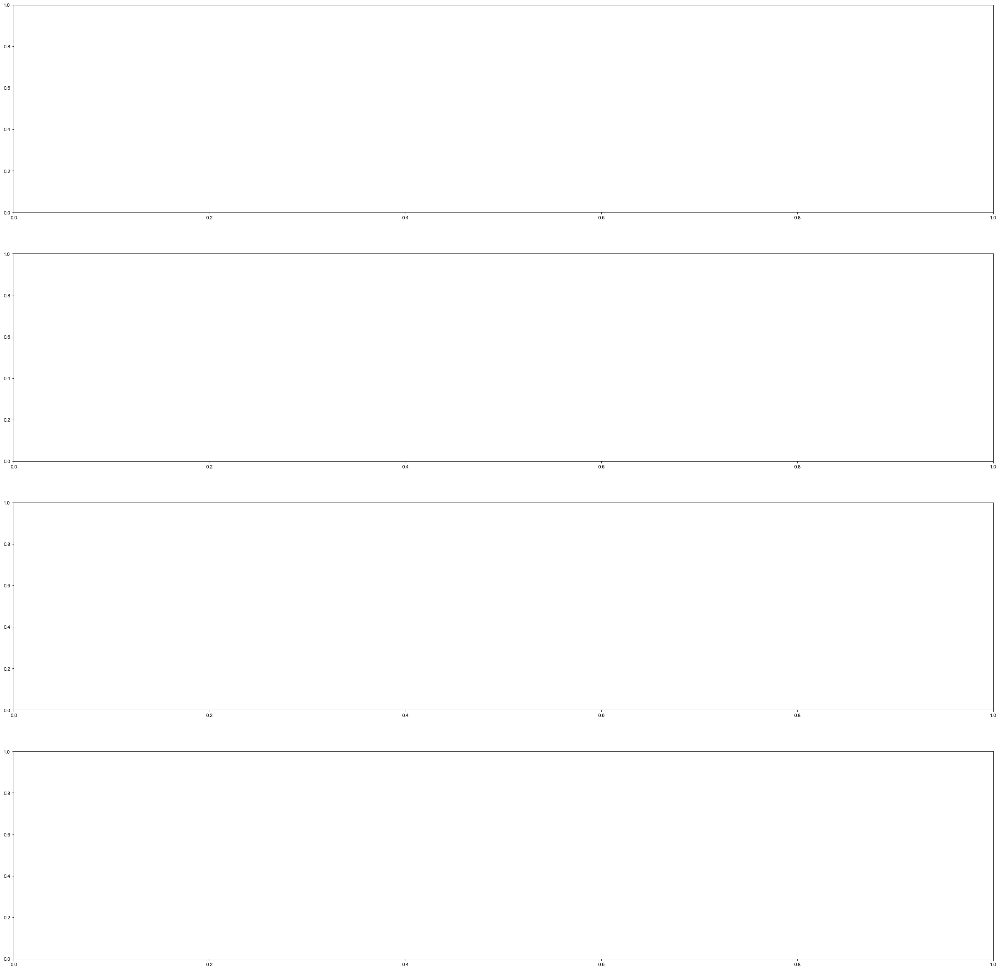

In [46]:
fig,ax = plt.subplots(4,figsize=(36,36))
plt.style.use('seaborn')
covid_peta.plot(column='Total Cases',cmap='Reds',figsize=(9,36),legend=True,ax=ax[0])
ax[0].set_title('Total kasus',fontsize=25)
covid_peta.plot(column='Total Deaths',cmap='Purples',figsize=(9,36),legend=True,ax=ax[1])
ax[1].set_title('Total Kematian',fontsize=25)
covid_peta.plot(column='Total Recovered',cmap='Greens',figsize=(9,36),legend=True,ax=ax[2])
ax[2].set_title('Total Sembuh',fontsize=25)
covid_peta.plot(column='Total Active Cases',cmap='Blues',figsize=(9,36),legend=True,ax=ax[3])
ax[3].set_title('Total Kasus Aktif',fontsize=25)

#add background color
ax[0].set_facecolor('#e0e0e0')
ax[1].set_facecolor('#e0e0e0')
ax[2].set_facecolor('#e0e0e0')
ax[3].set_facecolor('#e0e0e0')

for i in np.arange(4):
    ax[i].spines['top'].set_visible(False)
    ax[i].spines['right'].set_visible(False)
    ax[i].spines['left'].set_visible(False)
    ax[i].spines['bottom'].set_visible(False)
    for item in ax[i].get_xticklabels():
        item.set_visible(False)
    for item in ax[i].get_yticklabels():
        item.set_visible(False)
    ax[i].set_xticks([])
    ax[i].set_yticks([])


Model Klasifikasi Sederhana
Kali ini kita akan membuat model sederhana yang dapat menklasifikasi apakah sebuah urutan angka dari data New Active Cases itu menunjukkan kenaikan atau menunjukkan penurunan.

Feature Engineering
Untuk dapat melakukan klasifikasi tersebut, kita perlu membuat feature baru yang menunjukkan apakah sebuah urutan angka menunjukkan kenaikan maupun penurunan.

Dalam hal ini, kita akan menggunakkan numpy.polyfit() untuk membantu kita membuat feature tersebut.

numpy.polyfit() akan mencoba untuk menarik sebuah garis trend berdasarkan dari urutan data angka yang diberikan ke fungsi tersebut.

Dalam hal ini, output yang dihasilkan adalah nilai untuk variabel a dan b dalam fungsi y = ax + b
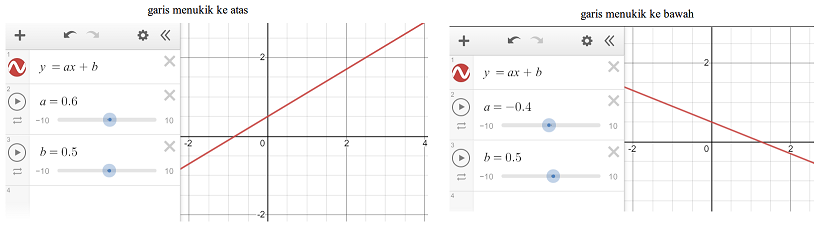


dengan mempergunakan numpy.polyfit() terhadap deretan angka New Active Cases, kita akan bisa membuat feature yang menunjukkan apakah deretan angka tersebut menunjukkan kenaikan, atau penurunan. Nantinya ini akan dipakai sebagai label untuk model klasifikasi kita.
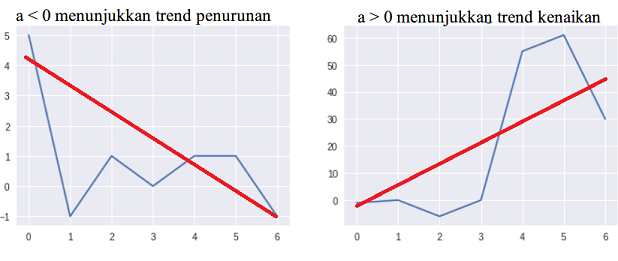

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
newActiveCasesVal = []

for location in data1['Location'].unique():
  provinceDf = data1[data1['Location'] == location][['New Active Cases']]

  # ambe angka mentah dari dataframe provinceDf dari kolom 'New Active Cases'
  newActiveCases = [x[1]['New Active Cases'] for x in list(provinceDf.iterrows())]

  # depe data new active cases ini banyak noise, torang se ilang tu noise kong se tinggal depe trend
  #
  # tu [30:-15] diterakhir itu mo se ilang missing/null value gegara torang da pake seasonal_decompose
  newActiveCasesTrend = list(seasonal_decompose(newActiveCases, model='additive', freq=31).trend)[30:-15]

  for dataColumn in range(0, len(newActiveCasesTrend), 7):
    slicedValues = newActiveCases[dataColumn:dataColumn + 7]
    label = ''

    # cari tau ini kumpulan data new active cases meningkat ato menurut pake numpy.polyfit.
    # nanti ini polyfit mo kase tau nilai variabel 'a' dengan 'b' dari y = ax + b (garis linear)
    # sumber : https://stackoverflow.com/questions/10048571/python-finding-a-trend-in-a-set-of-numbers
    sumbuX = np.arange(0, len(slicedValues))
    sumbuY = np.array(slicedValues)
    z = np.polyfit(sumbuX, sumbuY, 1)

    # cek kalo variabel 'a' itu nol ato negatif,
    # kalo betul, berarti tu garis itu ada ba bengko ka bawah (menurun)
    if z[0] <= 0:
      label = 'menurun'
    # kalo variabel 'a' positif, berarti tu garis ada ba bengko ka atas (meningkat)
    else:
      label = 'meningkat'
    
    newActiveCasesVal.append([slicedValues, label])

fig, axes = plt.subplots(4, 4, figsize=(24,18))

for row in range(4):
  for i, dataGroup in enumerate(newActiveCasesVal[row*4:row*4 + 4]):
    axes[row, i].plot(dataGroup[0])
    axes[row, i].set_title(dataGroup[1])

In [ ]:
print("Jumlah data = ", len(newActiveCasesVal))

In [ ]:
xTrain = []
yTrain = []
xVal = []
yVal = []

for row in newActiveCasesVal[:int(len(newActiveCasesVal) * 0.8)]:
  xTrain.append(row[0])
  yTrain.append(0 if row[1] == 'menurun' else 1)

for row in newActiveCasesVal[int(len(newActiveCasesVal) * 0.8):]:
  xVal.append(row[0])
  yVal.append(0 if row[1] == 'menurun' else 1)

print("Training dataset: ", len(xTrain) / len(newActiveCasesVal), "\nValdation dataset: ", len(xVal) / len(newActiveCasesVal))

In [ ]:
newActiveCasesVal[1:5]

In [38]:
from sklearn import svm

clf = svm.SVC(kernel='rbf')

clf.fit(xTrain, yTrain)
yPred = clf.predict(xVal)

NameError: name 'xTrain' is not defined

In [ ]:
from sklearn.metrics import confusion_matrix

confusion_matrix(yVal, yPred)

fig, ax = plt.subplots(figsize = (8,6))
sns.heatmap(confusion_matrix(y_true = yVal, y_pred = yPred), fmt = 'g', annot = True)
ax.xaxis.set_label_position('top')
ax.xaxis.set_ticks_position('top')
ax.set_xlabel('Prediction', fontsize = 14)
ax.set_xticklabels(['menurun (0)', 'meningkat (1)'])
ax.set_ylabel('Actual', fontsize = 14)
ax.set_yticklabels(['menurun (0)', 'meningkat (1)'])
plt.show()

In [ ]:
print("Accuracy:",metrics.accuracy_score(yVal, yPred))
print("rmse/root mean squared error :", metrics.mean_squared_error(yPred, yVal))

print(metrics.classification_report(yPred, yVal))

In [ ]:
import random
fig, axes = plt.subplots(4, 8, figsize=(24,9))

# torang gabung tu xVal, yVal, dengan yPred jadi satu list
predictions = list(zip(xVal, yVal, yPred))
random.shuffle(predictions)

# torang mo se tampilkan 4 baris ke bawah
for row in range(4):
  # torang mo se tampilkan 8 baris ke kanan
  for i, dataGroup in enumerate(predictions[row*8:row*8 + 8]):
    # plot tu data dari xVal
    axes[row, i].plot(dataGroup[0])

    # ator dpe title berdasarkan tu yVal dengan yPred
    axes[row, i].set_title(f"Actual: {'menurun' if dataGroup[1] == 0 else 'meningkat'}\nPrediction: {'menurun' if dataGroup[2] == 0 else 'meningkat'}")

    # supaya nda susah mo lia, torang kase warna hijau dpe background kalo misal depe actual class dengan predicted class itu sama
    # kong kase warna merah kalo misal baku beda
    if dataGroup[1] == dataGroup[2]:
      axes[row, i].set_facecolor('#c9ffd8')
    else:
      axes[row, i].set_facecolor('#ffdac9')

# ini mo auto fix depe margin dari tu tiap graf, gegara tadi qt
# ada tes sebelum pake ini fig.tight_layout(), ta baku cako
fig.tight_layout()

Single-step Univariate Forecasting

## 데이터 모델링 및 모델 성능 평가를 위한 준비
### 위치 규모 : 인도네시아 주

In [59]:
# 데이터 자르기 by New Deaths
X = data2.drop('New Deaths', axis = 1)
y = data2['New Deaths']

In [75]:
X

,New Cases,New Recovered,New Active Cases,Total Cases,Total Deaths,Total Recovered,Total Active Cases,Total Deaths per 100rb
2,2,0,2,2,0,0,2,0.00
5,0,0,0,2,0,0,2,0.00
9,0,0,0,2,0,0,2,0.00
13,0,0,0,2,0,0,2,0.00
18,2,0,2,4,0,0,4,0.00
...,...,...,...,...,...,...,...,...
21637,176,419,-254,4256112,143819,4104333,7960,54.23
21670,297,324,-38,4256409,143830,4104657,7922,54.24
21703,278,307,-39,4256687,143840,4104964,7883,54.24
21735,311,388,-87,4256998,143850,4105352,7796,54.25


In [76]:
y

2         0
5         0
9         0
13        0
18        0
         ..
21637    11
21670    11
21703    10
21735    10
21758     8
Name: New Deaths, Length: 642, dtype: int64

In [60]:
# test 데이터, train 데이터 나누기
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 42)

# 데이터 행, 열 출력
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(15837, 7)
(5280, 7)
(15837,)
(5280,)


In [61]:
# 전처리 - X 데이터에 StandardScaler 적용
pipeline = Pipeline([
    ('std_scalar', StandardScaler())
])

X_train = pipeline.fit_transform(X_train)
X_test = pipeline.transform(X_test)

In [62]:
# 모델 선정 + 데이터 학습 + 예측
def predict_model(model, trainX, testX, trainY, testY):
    m = model
    m.fit(trainX, trainY)
    predict_m = m.predict(testX)
    print('-----------{}-----------'.format(model))
    print_evaluate(testY, predict_m)

# 모델 성능 평가
def print_evaluate(true, predicted):  
    mae = metrics.mean_absolute_error(true, predicted)
    mse = metrics.mean_squared_error(true, predicted)
    rmse = np.sqrt(metrics.mean_squared_error(true, predicted))
    r2_square = metrics.r2_score(true, predicted)
    print('MAE:', mae)
    print('MSE:', mse)
    print('RMSE:', rmse)
    print('R2 Square', r2_square)
    print('__________________________________')

In [64]:
from sklearn import svm

In [65]:
# 모델별 성능 평가
model = [LinearRegression(), SVR(), DecisionTreeRegressor(),svm.SVC(kernel='rbf')]
for i in model:
    predict_model(i, X_train,X_test, y_train, y_test)

-----------LinearRegression()-----------
MAE: 4.601942299619308
MSE: 230.28069717693748
RMSE: 15.175002378152614
R2 Square 0.6386811279133854
__________________________________
-----------SVR()-----------
MAE: 4.076310457759865
MSE: 432.44197470943044
RMSE: 20.79523923183935
R2 Square 0.32148265807591947
__________________________________
-----------DecisionTreeRegressor()-----------
MAE: 3.4696496212121213
MSE: 150.97254971590908
RMSE: 12.287088740458787
R2 Square 0.7631185242700589
__________________________________
-----------SVC()-----------
MAE: 4.532007575757576
MSE: 368.3941287878788
RMSE: 19.193596035862555
R2 Square 0.42197608080588134
__________________________________


## Linear Regression의 결과가 R2 스코어 점수가 가장 높기 때문에, 우리는 다음으로 사망 사건 대 실제 사건에 대한 예측을 할 것이다.

MAE: 4.601942299619308
MSE: 230.28069717693748
RMSE: 15.175002378152614
R2 Square 0.6386811279133854
__________________________________


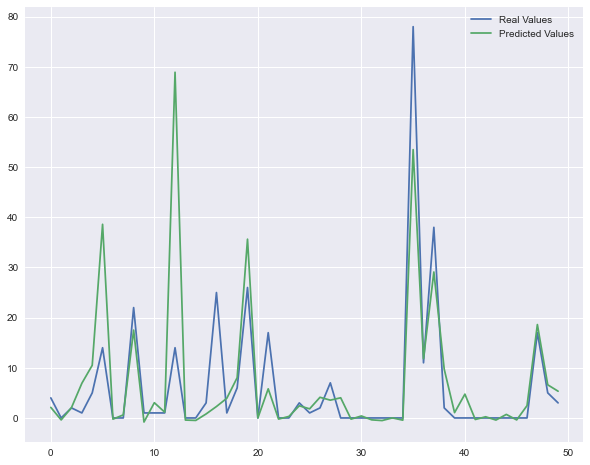

In [66]:
# 모델 선정 + 데이터 학습 + 예측 + 평가
dct = LinearRegression()
dct.fit(X_train, y_train)

pred_dct = dct.predict(X_test)
print_evaluate(y_test, pred_dct)

# DataFrame에 예측값, 실제값 저장
df_dct = pd.DataFrame({'Real Values':y_test, 'Predicted Values':pred_dct})
df_dct.head()

# DataFrame 시각화
plt.figure(figsize=(10,8))
plt.plot(df_dct['Real Values'].values[:50], label = 'Real Values')
plt.plot(df_dct['Predicted Values'].values[:50], label = 'Predicted Values')
plt.legend()
plt.show()

## R2 스코어 값이 약 60% 정도이기 때문에 여전히 오차가 있는 것으로 보입니다.
### 위치 규모 : 인도네시아 국가로 위치 확장

In [67]:
# 데이터 전처리 - Location이 Indonesia인 데이터만 사용
id_data = data[data['Location'] == 'Indonesia']

# 데이터 전처리 - 필요없는 열 제거
id_data.drop(['Date', 'Location', 'Longitude', 'Latitude','Location Level'], axis=1, inplace=True)
id_data

C:\Users\Hi\anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,New Cases,New Deaths,New Recovered,New Active Cases,Total Cases,Total Deaths,Total Recovered,Total Active Cases,Area (km2),Population,Population Density,Total Deaths per 100rb
2,2,0,0,2,2,0,0,2,1916907,265185520,138.34,0.00
5,0,0,0,0,2,0,0,2,1916907,265185520,138.34,0.00
9,0,0,0,0,2,0,0,2,1916907,265185520,138.34,0.00
13,0,0,0,0,2,0,0,2,1916907,265185520,138.34,0.00
18,2,0,0,2,4,0,0,4,1916907,265185520,138.34,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...
21637,176,11,419,-254,4256112,143819,4104333,7960,1916907,265185520,138.34,54.23
21670,297,11,324,-38,4256409,143830,4104657,7922,1916907,265185520,138.34,54.24
21703,278,10,307,-39,4256687,143840,4104964,7883,1916907,265185520,138.34,54.24
21735,311,10,388,-87,4256998,143850,4105352,7796,1916907,265185520,138.34,54.25


<AxesSubplot:>

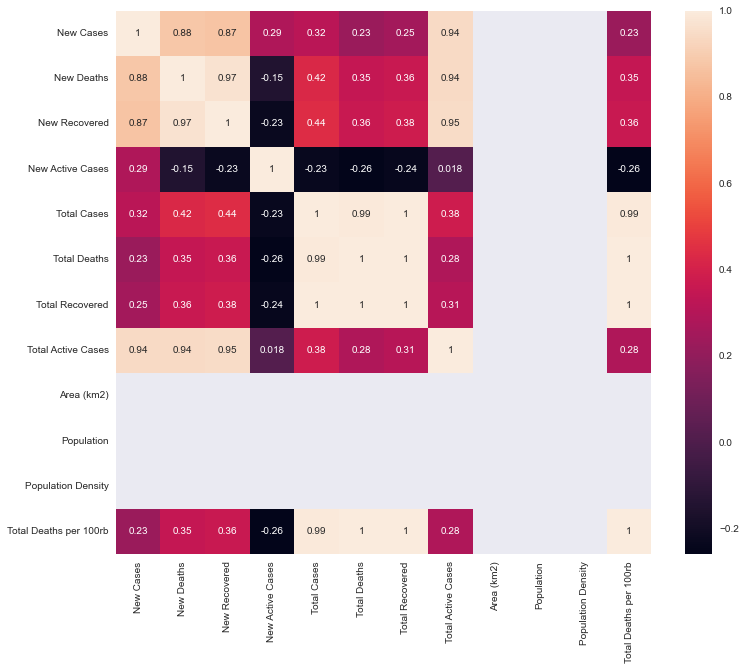

In [58]:
# 인도네시아 위치 규모에 대한 heatmap correlation 시각화
plt.figure(figsize=(12,10))
sns.heatmap(id_data.corr(), annot= True)

In [68]:
# 시각화되지 않는 열 제거
id_data.drop(['Area (km2)', 'Population', 'Population Density'], axis=1, inplace=True)
id_data.head()

C:\Users\Hi\anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,New Cases,New Deaths,New Recovered,New Active Cases,Total Cases,Total Deaths,Total Recovered,Total Active Cases,Total Deaths per 100rb
2,2,0,0,2,2,0,0,2,0.0
5,0,0,0,0,2,0,0,2,0.0
9,0,0,0,0,2,0,0,2,0.0
13,0,0,0,0,2,0,0,2,0.0
18,2,0,0,2,4,0,0,4,0.0


## 데이터 모델링 및 모델 성능 평가를 위한 준비
### 위치 규모: 인도네시아

In [69]:
# 데이터 자르기 by New Deaths
X = id_data.drop('New Deaths', axis=1)
y = id_data['New Deaths']

In [70]:
# test 데이터, train 데이터 나누기
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 42)

# 데이터 행, 열 출력
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(481, 8)
(161, 8)
(481,)
(161,)


In [71]:
# 전처리 - X 데이터에 StandardScaler 적용
pipeline = Pipeline([
    ('std_scalar', StandardScaler())
])

X_train = pipeline.fit_transform(X_train)
X_test = pipeline.transform(X_test)

In [72]:
# 모델 선정 + 데이터 학습 + 예측
def predict_model(model, trainX, testX, trainY, testY):
    m = model
    m.fit(trainX, trainY)
    predict_m = m.predict(testX)
    print('-----------{}-----------'.format(model))
    print_evaluate(testY, predict_m)

# 모델 성능 평가
def print_evaluate(true, predicted):  
    mae = metrics.mean_absolute_error(true, predicted)
    mse = metrics.mean_squared_error(true, predicted)
    rmse = np.sqrt(metrics.mean_squared_error(true, predicted))
    r2_square = metrics.r2_score(true, predicted)
    print('MAE:', mae)
    print('MSE:', mse)
    print('RMSE:', rmse)
    print('R2 Square', r2_square)
    print('__________________________________')

In [73]:
# 모델별 성능 평가
model = [LinearRegression(), SVR(), DecisionTreeRegressor(),svm.SVC(kernel='rbf')]
for i in model:
    predict_model(i, X_train,X_test, y_train, y_test)

-----------LinearRegression()-----------
MAE: 7.960020496436939e-12
MSE: 1.4431302065547233e-22
RMSE: 1.2013035447191202e-11
R2 Square 1.0
__________________________________
-----------SVR()-----------
MAE: 131.9996770353826
MSE: 110672.62306929333
RMSE: 332.67495106979925
R2 Square 0.0241745371379134
__________________________________
-----------DecisionTreeRegressor()-----------
MAE: 31.652173913043477
MSE: 3378.9068322981366
RMSE: 58.12836512665857
R2 Square 0.9702074168646859
__________________________________
-----------SVC()-----------
MAE: 81.5527950310559
MSE: 14591.75155279503
RMSE: 120.79632259632339
R2 Square 0.8713412376242353
__________________________________


MAE: 7.960020496436939e-12
MSE: 1.4431302065547233e-22
RMSE: 1.2013035447191202e-11
R2 Square 1.0
__________________________________


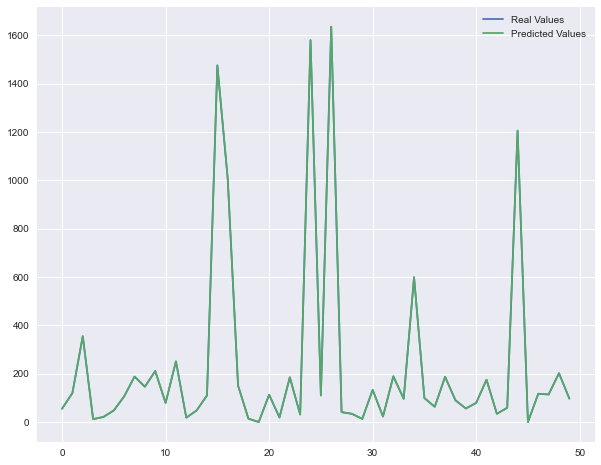

In [74]:
# 모델 선정 + 데이터 학습 + 예측 + 평가
dct = LinearRegression()
dct.fit(X_train, y_train)

pred_dct = dct.predict(X_test)
print_evaluate(y_test, pred_dct)

# DataFrame에 예측값, 실제값 저장
df_dct = pd.DataFrame({'Real Values':y_test, 'Predicted Values':pred_dct})
df_dct.head()

# DataFrame 시각화
plt.figure(figsize=(10,8))
plt.plot(df_dct['Real Values'].values[:50], label = 'Real Values')
plt.plot(df_dct['Predicted Values'].values[:50], label = 'Predicted Values')
plt.legend()
plt.show()